In [1]:
from swemnics.problems import SlopedBeachProblem
from swemnics import solvers as Solvers
from mpi4py import MPI
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dolfinx import fem as fe
import pickle
import os
import os
import pickle
import numpy as np
from itertools import product
import time
import pandas as pd
import seaborn as sns

from dca_utils import*
from metrics import calculate_analysis_metrics
from data_io import save_pickle, load_pickle
from fourd_var import run_assimilation, setup_data_assimilation, run_data_assimilation
from plotting import plot_mixed_function, plot_comparison1, plot_comparison2



sns.set_palette("bright")
plt.style.use("mystyle1.mplstyle")


In [3]:
comm = MPI.COMM_WORLD
rank = comm.Get_rank()
size = comm.Get_size()

final_time = 7 * Time.TWENTY_FOUR_HOURS.seconds   # 7 days in seconds
window_size = Time.ONE_HOUR.seconds

dt = 600  # 30 minutes in seconds
problem_params = {
    'dt': dt,
    't': 0,
    't_final': final_time,
    'num_steps': int(np.ceil(final_time/dt)),
    'num_windows': final_time//window_size,  # divide by 4 hours in seconds = 42 windows
    'fric_law': 'linear',    #friction law either quadratic or linear
    'alpha': 2.0 * np.pi / Time.TWELVE_HOURS.seconds,  # 2.5 cycles per 12 hours
    'sol_var': 'h'             #solution variable either h or hu
}

solver_params = {"rtol": 1e-5,
          "atol": 1e-6,
          "max_it":10,
          "relaxation_parameter":1.0,
          "ksp_type": "gmres",
          "pc_type": "ilu",
          "ksp_ErrorIfNotConverged": False
          }#,"pc_factor_mat_solver_type":"mumps"}


prob, solver = create_problem_solver(problem_params, "sloped_beach", true_signal=True, verbose=True)





SWE TYPE full
Wetting drying activated 

Location of shoreline: 13800
setting initial condition
Fully conservative flux
Fully conservative flux
WD nonspherical

CF =  0.025
Adding DG boundary conditions weakly
Fully conservative flux


In [3]:
run_true = True  # Set to True to run the true solver and generate the true signal

if run_true:
    assert problem_params['num_steps'] == int(np.ceil(problem_params['t_final']/problem_params['dt']))
    true_solver = get_true_signal(solver,'sloped_beach', solver_params,1)
    true_signal = np.array(true_solver.saved_states)


calling time loop
plot every 60
nt 1008
creating video
Interpolating bathymetry
Writing bathymetry
Wrote bathymetry
Time Step Number 0 Out of 1008
0.0 % Complete
Residual norm 443.19953179660007
linear solver convergence 3, iterations 10, resid norm 2.2315064799682279e-10
dx_0 norm, 0.10929672257396618
Netwon Iteration 1: Correction norm 0.9999999999999999
Residual norm 0.04045963668282227
linear solver convergence 3, iterations 4, resid norm 8.962658188545032e-10
Netwon Iteration 2: Correction norm 7.846092558329381e-05
Residual norm 8.913869049344774e-05
linear solver convergence 3, iterations 0, resid norm 8.96266177454444e-10
Netwon Iteration 3: Correction norm 0.0
Time Step Number 1 Out of 1008
0.0992063492063492 % Complete
Residual norm 1418.2260444538188
linear solver convergence 3, iterations 10, resid norm 7.282265596325327e-10
dx_0 norm, 0.3781836075078509
Netwon Iteration 1: Correction norm 1.0000000000000002
Residual norm 0.42773055363194745
linear solver convergence 3, ite

In [ ]:
# run_true = False
# if run_true:
#     # # Plot 1: Time series at a single grid point (e.g., center point)
#     mid_idx = true_signal.shape[1] // 2
#     plt.figure(figsize=(10, 4))
#     plt.plot(true_signal[:, mid_idx], label=f"Grid point 1 {mid_idx}")
#     # plt.plot(true_signal2[:, mid_idx],label=f"Grid point 2 {mid_idx}")  # Add points for clarity
#     plt.xlabel("Time step")
#     plt.ylabel("Solution value")
#     plt.title("Time series at grid point")
#     plt.grid(True)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

#     # Plot 2: Spatial average over time
#     spatial_mean = true_signal.mean(axis=1)
#     plt.figure(figsize=(10, 4))
#     plt.plot(spatial_mean, label="Spatial average")
#     plt.xlabel("Time step")
#     plt.ylabel("Average solution")
#     plt.title("Spatial average over time")
#     plt.grid(True)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

#     # Plot 3: Time–space heatmap with time on x-axis
#     plt.figure(figsize=(12, 6))
#     plt.imshow(true_signal.T, aspect='auto', cmap='viridis', origin='lower')
#     plt.colorbar(label="Solution value")
#     plt.xlabel("Time step")
#     plt.ylabel("Spatial index")
#     plt.title("Time–space heatmap of true signal (time on x-axis)")
#     plt.tight_layout()
#     plt.show()



In [ ]:

#open true signal with pickle
# true_signal = load_pickle("true_signal.pkl")

# # problem_params['fric_law'] = 'mannings'  # Change friction law to mannings for this DA experiment
# problem_params.update({'fric_law': 'mannings', 'dt': 600}) # Change friction law to mannings for this DA expirement

# obs_std=0.5
# obs_time_freq = 1
# obs_space_freq = 2 # Frequency of observation in space (every 4th cell) # Note observations are taken in terms of height, not velocity
# total_steps = int((problem_params['t_final']/problem_params['dt']) + 1)
# problem_params['num_steps'] = int(np.ceil(final_time/problem_params['dt'])/problem_params['num_windows']) # Size of each assimilation window
# obs_per_window = problem_params['num_steps'] // obs_time_freq

# H, stations, obs_spatial_indices = build_observation_matrix(prob, prob.V, obs_space_freq)
# obs_indices_per_window, obs_time_indices = setup_observation_indices(problem_params['num_steps'], obs_time_freq, total_steps)

# # Create synthetic observations
# y_obs = generate_observations(true_signal, H, obs_time_indices, obs_std)


# # Generate Background,Observation, and Predicted Error Covariance Matrices
# state_dim = true_signal.shape[1]
# obs_dim = stations.shape[0]

# # Observation Covariance 
# R = np.eye(obs_dim) * (obs_std**2)

# inflation_factor = 4.0
# B = inflation_factor*np.eye(state_dim) 

# # Predicted Covariance
# L = H @ B @ H.T 

# # Get Inverse Covariance matrices
# R_inv = np.linalg.inv(R)
# B_inv = np.linalg.inv(B) 
# L_inv = np.linalg.inv(L)

# covs = {"B_inv": B_inv, "R_inv": R_inv, "L_inv": L_inv}

# hb = 5.0 / 13800 * (13800 - stations[:, 0])

# print(f"\n Total Steps: {total_steps}\n"
#       f"Total Assimilation Windows: {problem_params['num_windows']}\n"
#       f"Steps per Window: {problem_params['num_steps']}\n"
#       f"Obs Time Frequency: {obs_time_freq}\n"
#       f"Total Obs: {obs_per_window * problem_params['num_windows']}\n"
#       f"Number Stations: {stations.shape[0]}\n"
#       f"Obs per Window: {obs_per_window}\n"
#       )




# print(f"\nState Dimension: {state_dim}\n"
#       f"Observation Dimension: {obs_dim}\n"
#       f"Background Covariance Matrix Shape B: {B.shape}\n"
#       f"Observation Covariance Matrix Shape R: {R.shape}\n"
#       f"Predicted Error Covariance Matrix shape L: {L.shape}\n"
#       f"Observation Matrix Shape H: {H.shape}\n",
#       f"y_obs shape: {y_obs.shape}\n",
#       f"Stations shape: {stations.shape}\n",
# )





In [2]:
# obs_std_values = [1.5, 2.0] # Observation standard deviations to test
# inflation_factor_values = [10.0, 12.0] 
# wme_results = analyze_error_statistics(obs_std_values, inflation_factor_values,result, 
#                             analysis_type='dci_wme')

In [3]:
# Linear Friction True Signal Case: # Paper Case
analysis_types = ['dci_wme']  # Include both analysis types
# analysis_types = ['dci_wme','dci']  # Include both analysis types

final_time = Time.SEVEN_DAYS.seconds  # 7 days in seconds
window_size = Time.ONE_HOUR.seconds
inflation_factor = 10.0
obs_std = 1.6
da_results = run_data_assimilation(analysis_types = analysis_types,
                                run_true_signal=False,
                                obs_std=obs_std,
                                inflation_factor=inflation_factor,
                                window_size=window_size,
                                final_time=final_time,
                                obs_time_freq=1,
                                obs_space_freq=2,
                                friction_type="linear"
                                )



 friction_type: linear 


SWE TYPE full
Wetting drying activated 

Location of shoreline: 13800
setting initial condition
Fully conservative flux
Fully conservative flux
WD nonspherical

CF =  0.025
Adding DG boundary conditions weakly
Fully conservative flux
DATA ASSIMILATION EXPERIMENT SETUP

Input Parameters:
  Pickle path: true_signal.pkl
  Observation std deviation: 1.6
  Observation space frequency: 2
  Observation time frequency: 1
  Final time: 604800
  Inflation factor: 10.0

Problem Parameters:
  dt: 600
  t: 0
  t_final: 604800
  num_steps: 6
  num_windows: 168
  fric_law: mannings
  alpha: 0.0001454441043328608
  sol_var: h

Calculated Dimensions:
  State dimension: 1296
  Observation dimension: 72
  Total time steps: 1009
  Observations per window: 6
  Number of observation obs_stations: 72

Matrix Information:
  Observation matrix H shape: (72, 1296)
  Background covariance B shape: (1296, 1296)
  Observation covariance R shape: (72, 72)
  Predicted covariance L shape: 

Processing windows: 100%|██████████| 168/168 [06:26<00:00,  2.30s/window]

DCI-WME analysis completed and saved.


In [4]:
# Case 1: DCI Analysis 
dci_rmse, dci_misfit = calculate_analysis_metrics(
    analysis_name="dci",
)

# Case 2: Bayes Analysis 
bayes_rmse, bayes_misfit = calculate_analysis_metrics(
    analysis_name="bayes",
)

# # Case 3: DCI WME Analysis 
wme_rmse, wme_misfit = calculate_analysis_metrics(
    analysis_name="dci_wme",
)

DCI RMSE: 0.4912766998, DCI, Relative Misfit: 0.2069
BAYES RMSE: 0.5272455065, BAYES, Relative Misfit: 0.2281
DCI_WME RMSE: 0.5272194124, DCI_WME, Relative Misfit: 0.2281


In [5]:
# Linear Friction True Signal Case: # Paper Case
analysis_types = ['dci_wme']  # Include both analysis types
# analysis_types = ['bayes']  # Include both analysis types

final_time = Time.TWO_DAYS.seconds  # 3 days in seconds
window_size = Time.TWO_HOURS.seconds
inflation_factor = 10.0
obs_std = 1.6
da_results = run_data_assimilation(analysis_types = analysis_types,
                                run_true_signal=False,
                                obs_std=obs_std,
                                inflation_factor=inflation_factor,
                                window_size=window_size,
                                final_time=final_time,
                                obs_time_freq=1,
                                obs_space_freq=2,
                                friction_type="linear"
                                )

print("\n\n\n")
print(f"Errors for Linear Friction Case:\n")

result = setup_data_assimilation(
    pickle_path='true_signal.pkl',
    problem_params=problem_params,
    prob=prob,
    obs_std=obs_std,
    obs_space_freq=2,
    obs_time_freq=1,
    final_time=final_time,
    inflation_factor=inflation_factor,  
    print_setup=False
)
# # Case 1: DCI Analysis 
# dci_rmse, dci_misfit = calculate_analysis_metrics(
#     analysis_name="dci",
# )

# Case 2: Bayes Analysis 
# bayes_rmse, bayes_misfit = calculate_analysis_metrics(
#     analysis_name="bayes",
# )

# # Case 3: DCI WME Analysis 
wme_rmse, wme_misfit = calculate_analysis_metrics(
    analysis_name="dci_wme",
)



 friction_type: linear 


SWE TYPE full
Wetting drying activated 

Location of shoreline: 13800
setting initial condition
Fully conservative flux
Fully conservative flux
WD nonspherical

CF =  0.025
Adding DG boundary conditions weakly
Fully conservative flux
DATA ASSIMILATION EXPERIMENT SETUP

Input Parameters:
  Pickle path: true_signal.pkl
  Observation std deviation: 1.6
  Observation space frequency: 2
  Observation time frequency: 1
  Final time: 172800
  Inflation factor: 10.0

Problem Parameters:
  dt: 600
  t: 0
  t_final: 172800
  num_steps: 12
  num_windows: 24
  fric_law: mannings
  alpha: 0.0001454441043328608
  sol_var: h

Calculated Dimensions:
  State dimension: 1296
  Observation dimension: 72
  Total time steps: 289
  Observations per window: 12
  Number of observation obs_stations: 72

Matrix Information:
  Observation matrix H shape: (72, 1296)
  Background covariance B shape: (1296, 1296)
  Observation covariance R shape: (72, 72)
  Predicted covariance L shape: 

Processing windows: 100%|██████████| 24/24 [01:23<00:00,  3.49s/window]

DCI-WME analysis completed and saved.




Errors for Linear Friction Case:

DCI_WME RMSE: 0.4357741785, DCI_WME, Relative Misfit: 0.1906


In [6]:
# Linear Friction True Signal Case: # Paper Case
analysis_types = ['dci_wme']  # Include both analysis types
# analysis_types = ['bayes']  # Include both analysis types

final_time = Time.TWO_DAYS.seconds  # 3 days in seconds
window_size = Time.TWO_HOURS.seconds
inflation_factor = 10.0
obs_std = 1.6
da_results = run_data_assimilation(analysis_types = analysis_types,
                                run_true_signal=False,
                                obs_std=obs_std,
                                inflation_factor=inflation_factor,
                                window_size=window_size,
                                final_time=final_time,
                                obs_time_freq=1,
                                obs_space_freq=2,
                                friction_type="linear"
                                )

print("\n\n\n")
print(f"Errors for Linear Friction Case:\n")

result = setup_data_assimilation(
    pickle_path='true_signal.pkl',
    problem_params=problem_params,
    prob=prob,
    obs_std=obs_std,
    obs_space_freq=2,
    obs_time_freq=1,
    final_time=final_time,
    inflation_factor=inflation_factor,  
    print_setup=False
)
# # Case 1: DCI Analysis 
# dci_rmse, dci_misfit = calculate_analysis_metrics(
#     analysis_name="dci",
# )

# Case 2: Bayes Analysis 
# bayes_rmse, bayes_misfit = calculate_analysis_metrics(
#     analysis_name="bayes",
# )

# # Case 3: DCI WME Analysis 
wme_rmse, wme_misfit = calculate_analysis_metrics(
    analysis_name="dci_wme",
)



 friction_type: linear 


SWE TYPE full
Wetting drying activated 

Location of shoreline: 13800
setting initial condition
Fully conservative flux
Fully conservative flux
WD nonspherical

CF =  0.025
Adding DG boundary conditions weakly
Fully conservative flux
DATA ASSIMILATION EXPERIMENT SETUP

Input Parameters:
  Pickle path: true_signal.pkl
  Observation std deviation: 1.6
  Observation space frequency: 2
  Observation time frequency: 1
  Final time: 172800
  Inflation factor: 10.0

Problem Parameters:
  dt: 600
  t: 0
  t_final: 172800
  num_steps: 12
  num_windows: 24
  fric_law: mannings
  alpha: 0.0001454441043328608
  sol_var: h

Calculated Dimensions:
  State dimension: 1296
  Observation dimension: 72
  Total time steps: 289
  Observations per window: 12
  Number of observation obs_stations: 72

Matrix Information:
  Observation matrix H shape: (72, 1296)
  Background covariance B shape: (1296, 1296)
  Observation covariance R shape: (72, 72)
  Predicted covariance L shape: 

Processing windows: 100%|██████████| 24/24 [01:35<00:00,  3.97s/window]

DCI-WME analysis completed and saved.




Errors for Linear Friction Case:

DCI_WME RMSE: 0.4358306767, DCI_WME, Relative Misfit: 0.1906


In [5]:
print(f"Errors for Linear Friction Case:\n")

result = setup_data_assimilation(
    pickle_path='true_signal.pkl',
    problem_params=problem_params,
    prob=prob,
    obs_std=obs_std,
    obs_space_freq=2,
    obs_time_freq=1,
    final_time=final_time,
    inflation_factor=inflation_factor,  
    print_setup=False
)
# Case 1: DCI Analysis 
dci_rmse, dci_misfit = calculate_analysis_metrics(
    analysis_name="dci",
)

# Case 2: Bayes Analysis 
# bayes_rmse, bayes_misfit = calculate_analysis_metrics(
#     analysis_name="bayes",
# )

# # Case 3: DCI WME Analysis 
wme_rmse, wme_misfit = calculate_analysis_metrics(
    analysis_name="dci_wme",
)

Errors for Linear Friction Case:

DCI RMSE: 0.5272206490, DCI, Relative Misfit: 0.2281
DCI_WME RMSE: 0.5272192292, DCI_WME, Relative Misfit: 0.2281


In [4]:
result = setup_data_assimilation(
    pickle_path='true_signal.pkl',
    problem_params=problem_params,
    prob=prob,
    obs_std=1.6,
    obs_space_freq=2,
    obs_time_freq=1,
    final_time=final_time,
    inflation_factor=10.0,  
    print_setup=True
)
filtered_stations=result['obs_stations']

DATA ASSIMILATION EXPERIMENT SETUP

Input Parameters:
  Pickle path: true_signal.pkl
  Observation std deviation: 1.6
  Observation space frequency: 2
  Observation time frequency: 1
  Final time: 604800
  Inflation factor: 10.0

Problem Parameters:
  dt: 600
  t: 0
  t_final: 604800
  num_steps: 6
  num_windows: 168
  fric_law: mannings
  alpha: 0.0001454441043328608
  sol_var: h

Calculated Dimensions:
  State dimension: 1296
  Observation dimension: 72
  Total time steps: 1009
  Observations per window: 6
  Number of observation obs_stations: 72

Matrix Information:
  Observation matrix H shape: (72, 1296)
  Background covariance B shape: (1296, 1296)
  Observation covariance R shape: (72, 72)
  Predicted covariance L shape: (72, 72)

Observation Setup:
  Number of observation time indices: 1009
  Observation spatial indices: [ 0  2  4  6  8 10 12 14 16 18]...

Generated Data:
  True signal shape: (1009, 1296)
  Observations y_obs shape: (1009, 72)


Plot saved to: true_sloped_beach_plot.png


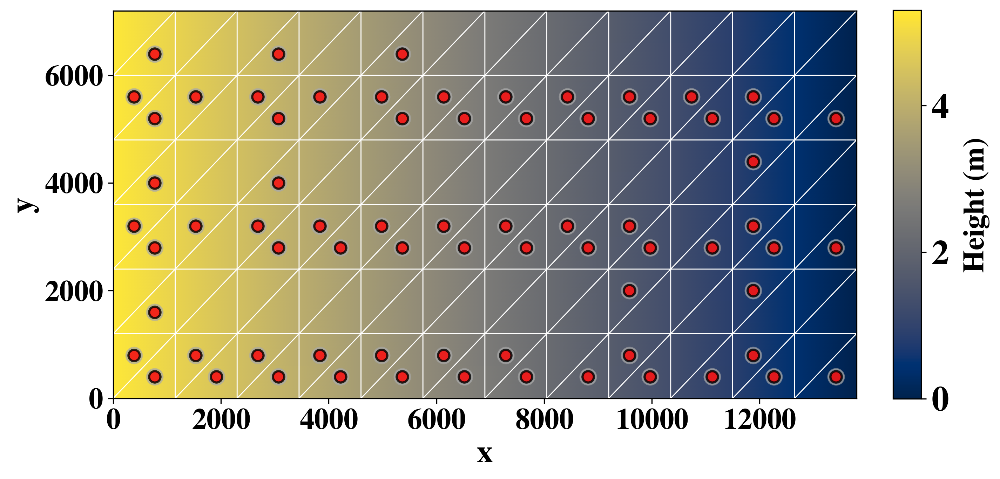

In [5]:
# result = load_pickle('setup_result.pkl')
true_signal = load_pickle('true_signal.pkl')
    
plot_mixed_function(prob.mesh,
                    prob.V,
                    true_signal[0],
                    stations=filtered_stations,
                    station_style='halo',
                    save_path='true_sloped_beach_plot.png')

In [ ]:

true_signal = load_pickle('true_signal.pkl')
bayes_analysis = load_pickle('bayes_analysis.pkl')
dci_analysis = load_pickle('dci_analysis.pkl')
dci_wme_analysis = load_pickle('dci_wme_analysis.pkl')


metrics = compute_daily_metrics(
    true_signal,
    bayes_analysis, 
    dci_analysis, 
    dci_wme_analysis,
    result,
    num_days=7
)


NameError: name 'rmse' is not defined

In [ ]:
df, latex_str = create_analysis_table(
    metrics, 
    num_days=7,
    output_file='custom_analysis.tex',
    save_csv=True,
    save_pickle=True,
    method_names={
        'bayes': 'Bayesian 4D-Var',
        'dci': 'DCI Method', 
        'dci_wme': 'DCI-WME Method'
    },
    float_format="{:.4f}",
    caption='Custom Analysis Results',
    label='tab:custom_results'
)

In [ ]:
V_sub = prob.V.sub(0)
V_sub_c, sub_map = V_sub.collapse()

true_signal = load_pickle('true_signal.pkl')[:,sub_map]
bayes_analysis = load_pickle('bayes_analysis.pkl')[:,sub_map]
dci_analysis = load_pickle('dci_analysis.pkl')[:,sub_map]
dci_wme_analysis = load_pickle('dci_wme_analysis.pkl')[:,sub_map]
saved_true_bathy = load_pickle('true_bathy.pkl')
saved_bathy = load_pickle('da_bathy.pkl')

In [ ]:


true_signal, bayes_analysis, dci_analysis, dci_wme_analysis, plot_triplets_1 = prepare_analysis_data(
    true_signal, bayes_analysis, dci_analysis, dci_wme_analysis,
    saved_bathy, saved_true_bathy, num_days=7
)

# true_signal = true_signal - saved_true_bathy
# bayes_analysis = bayes_analysis - saved_bathy
# dci_analysis = dci_analysis - saved_bathy
# dci_wme_analysis = dci_wme_analysis - saved_bathy


# num_days = 7
# one_day = int(true_signal.shape[0] / num_days)
# plot_triplets_1 = []
# bayes_rmses = []; bayes_misfits = []
# dci_rmses = []; dci_misfits = []
# dci_wme_rmses = []; dci_wme_misfits = []

# for day in range(1, num_days):
#     bath = saved_bathy[day * one_day, :]
#     true_bath = saved_true_bathy[day * one_day, :]
#     true = true_signal[day * one_day, :]
#     bayes_estimate = bayes_analysis[day * one_day, :]
#     dci_estimate = dci_analysis[day * one_day, :]
#     dci_wme_estimate = dci_wme_analysis[day * one_day, :]
#     bayes_diff = true - bayes_estimate
#     dci_diff = true - dci_estimate
#     dci_wme_diff = true - dci_wme_estimate
#     plot_triplets_1.append((bayes_diff, dci_diff, dci_wme_diff))
    

# # Add the final day using (num_days * one_day - 1)
# bath = saved_bathy[(num_days * one_day) - 1, :]
# true_bath = saved_true_bathy[(num_days * one_day) - 1, :]
# true = true_signal[(num_days * one_day) - 1, :]
# bayes_estimate = bayes_analysis[(num_days * one_day) - 1, :]
# dci_estimate = dci_analysis[(num_days * one_day) - 1, :]
# dci_wme_estimate = dci_wme_analysis[(num_days * one_day) - 1, :]
# bayes_diff = true - bayes_estimate
# dci_diff = true - dci_estimate
# dci_wme_diff = true - dci_wme_estimate
# plot_triplets_1.append((bayes_diff, dci_diff, dci_wme_diff))


Figure saved to: sloped_beach_comparison.png


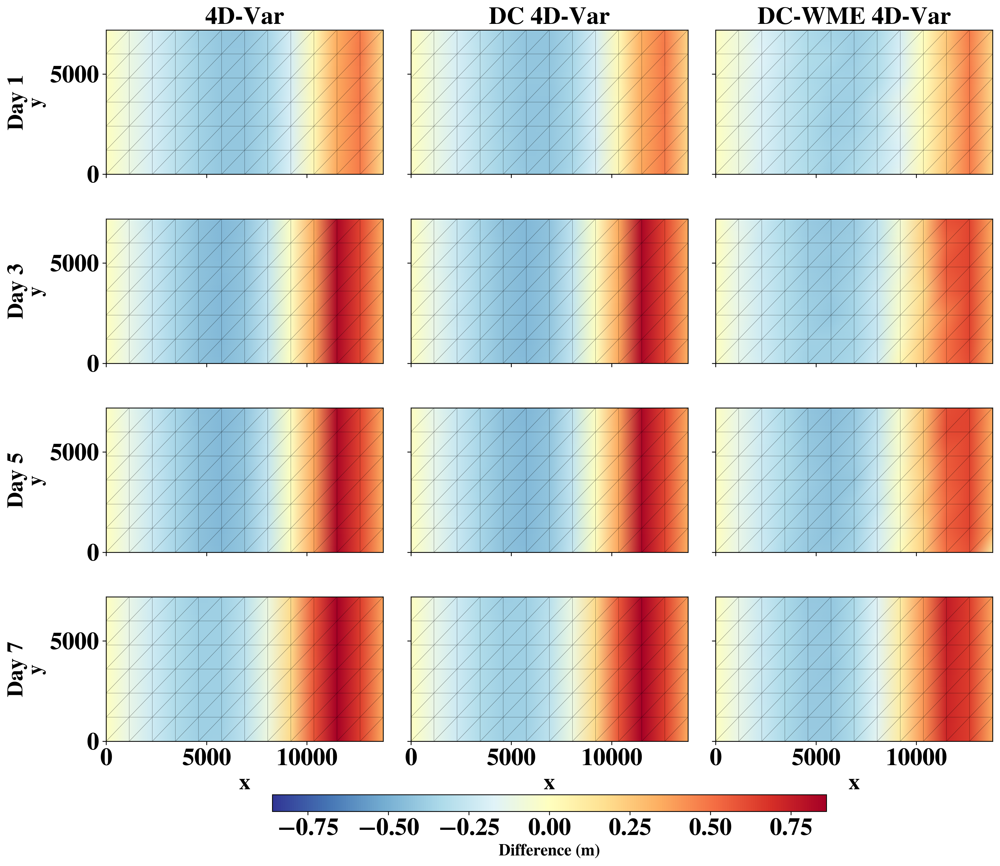

In [26]:
plot_comparison1_temp(prob.mesh,
                prob.V,
                plot_triplets_1,
                component=0,
                titles=None,
                stations=None,
                cmap='cividis',
                diff_cmap='RdYlBu_r',
                selected_days=[1,3, 5, 7],
                save_path='sloped_beach_comparison.png',
                dpi=300,
                format='png',
                show=True,
)

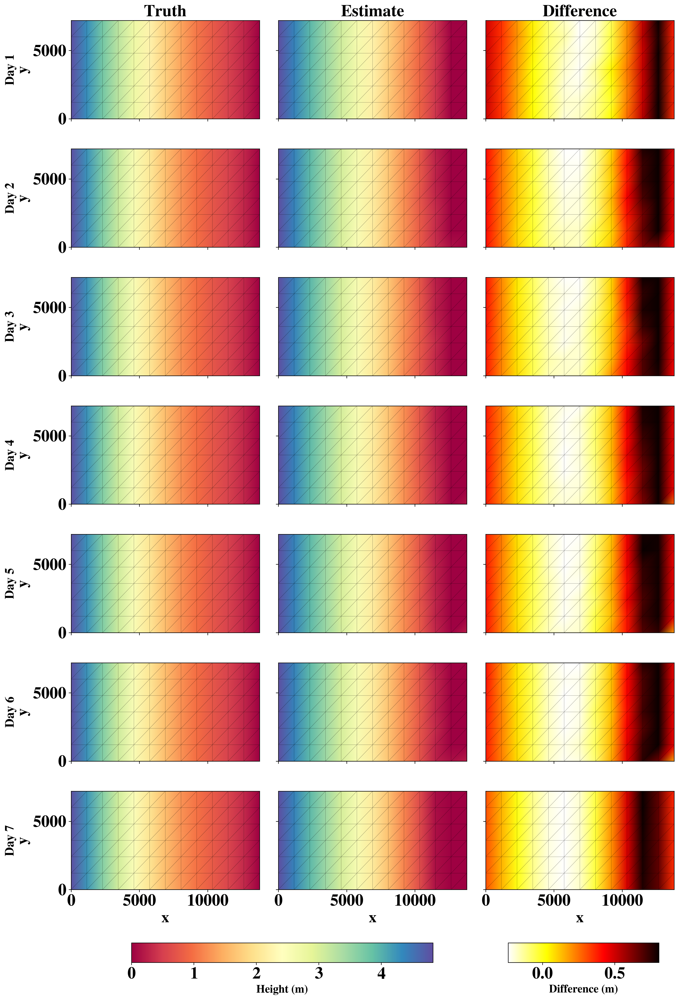

In [ ]:
V_sub = prob.V.sub(0)
V_sub_c, sub_map = V_sub.collapse()

true_signal = load_pickle('true_signal.pkl')[:,sub_map]
dci_wme_analysis = load_pickle('dci_wme_analysis.pkl')[:,sub_map]
saved_true_bathy = load_pickle('true_bathy.pkl')
saved_bathy = load_pickle('da_bathy.pkl')
# true_signal = true_signal - saved_true_bathy
# dci_wme_analysis = dci_wme_analysis - saved_bathy

plot_triplets = create_plot_triplets(true_signal, dci_wme_analysis, num_days=7)

# num_days=7
# one_day = int(true_signal.shape[0] / num_days)
# plot_triplets = []

# for day in range(1, num_days):
#     true = true_signal[day * one_day, :]
#     estimate = dci_wme_analysis[day * one_day, :]
#     diff = true - estimate
#     plot_triplets.append((true, estimate, diff))

# # Add the final day using (num_days * one_day - 1)
# true = true_signal[(num_days * one_day) - 1, :]
# estimate = dci_wme_analysis[(num_days * one_day) - 1, :]
# diff = true - estimate
# plot_triplets.append((true, estimate, diff))


plot_comparison2(prob.mesh,
                prob.V,
                plot_triplets,
                component=0,
                titles=None,
                stations=None,
                cmap='Spectral',
                diff_cmap='hot_r',
                save_path=None,
                dpi=300,
                format='png',
                show=True)